<a href="https://colab.research.google.com/github/SutthikanKhamsiri/Portfolio/blob/master/AprCalVolume_GroupInterpret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install scipy

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import pandas as pd

In [ ]:
df1 = pd.read_csv('/content/L2009topo1.dat')
df2 = pd.read_csv('/content/L1006topo.dat')
df3 = pd.read_csv('/content/L3011topo.dat')

In [ ]:
print(df1, df2, df3)

    T201113009
0         1.50
1            7
2          110
3            1
4            0
..         ...
151          0
152          0
153          0
154          0
155          0

[156 rows x 1 columns]     T201113006
0         1.50
1            7
2          110
3            1
4            0
..         ...
156          0
157          0
158          0
159          0
160          0

[161 rows x 1 columns]     T201113011
0         1.50
1            7
2          192
3            1
4            0
..         ...
237          0
238          0
239          0
240          0
241          0

[242 rows x 1 columns]


In [ ]:
df11 = df1[5:115]

In [ ]:
df22 = df2[5:115]

In [ ]:
df33 = df3[5:197]

In [ ]:
print(df11)

                           T201113009
5     21.75\t1.5\t211.4713401\t93.175
6    23.25\t1.5\t211.4724367\t434.094
7    24.75\t1.5\t211.4735334\t468.156
8      26.25\t1.5\t211.4746301\t835.7
9    27.75\t1.5\t211.4757268\t924.282
..                                ...
110  35.25\t1.5\t202.7786332\t204.335
111     36.75\t1.5\t202.24937\t80.402
112   38.25\t1.5\t201.2876248\t42.981
113   35.25\t1.5\t201.7786332\t83.423
114     36.75\t1.5\t201.24937\t47.996

[110 rows x 1 columns]


In [ ]:
df111 = df11['T201113009'].str.split(expand=True)
df222 = df22['T201113006'].str.split(expand=True)
df333 = df33['T201113011'].str.split(expand=True)

In [ ]:
print(df111, df222, df333)

         0    1            2        3
5    21.75  1.5  211.4713401   93.175
6    23.25  1.5  211.4724367  434.094
7    24.75  1.5  211.4735334  468.156
8    26.25  1.5  211.4746301    835.7
9    27.75  1.5  211.4757268  924.282
..     ...  ...          ...      ...
110  35.25  1.5  202.7786332  204.335
111  36.75  1.5    202.24937   80.402
112  38.25  1.5  201.2876248   42.981
113  35.25  1.5  201.7786332   83.423
114  36.75  1.5    201.24937   47.996

[110 rows x 4 columns]          0    1            2         3
5    21.75  1.5  209.5168262    253.93
6    23.25  1.5  210.1410159   358.668
7    24.75  1.5   210.787966  1596.043
8    26.25  1.5  211.5121919  1682.124
9    27.75  1.5  212.2387444  2104.099
..     ...  ...          ...       ...
110  35.25  1.5  205.3789601   209.949
111  36.75  1.5  205.3916129   325.162
112  38.25  1.5  205.4343755   163.285
113  35.25  1.5  204.3789601   151.808
114  36.75  1.5  204.3916129   209.313

[110 rows x 4 columns]          0    1            2

In [ ]:
df111['X'] = 0
df222['X'] = -9.5
df333['X'] = -19

In [ ]:
df_merge = pd.concat([df111,df222,df333])

In [ ]:
print(df_merge)

         0    1            2        3     X
5    21.75  1.5  211.4713401   93.175   0.0
6    23.25  1.5  211.4724367  434.094   0.0
7    24.75  1.5  211.4735334  468.156   0.0
8    26.25  1.5  211.4746301    835.7   0.0
9    27.75  1.5  211.4757268  924.282   0.0
..     ...  ...          ...      ...   ...
192  32.25  1.5  202.4071502  216.963 -19.0
193  33.75  1.5  202.3114286  180.999 -19.0
194  35.25  1.5  202.1373608  157.839 -19.0
195  36.75  1.5  202.0057027  115.508 -19.0
196  38.25  1.5  201.9376152  124.989 -19.0

[412 rows x 5 columns]


In [ ]:
df_merge = df_merge.rename(columns={0:'Y',1:'spacing',2:'Z',3:'resist'})

In [ ]:
df_merge['resist']=df_merge['resist'].astype('float')
df_merge['X']=df_merge['X'].astype('float')
df_merge['Y']=df_merge['Y'].astype('float')
df_merge['Z']=df_merge['Z'].astype('float')

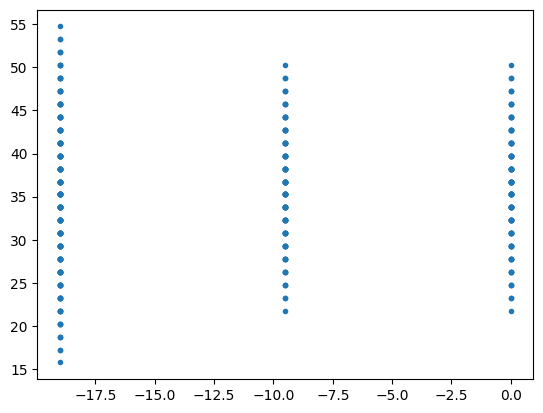

In [ ]:
plt.plot(df_merge['X'],df_merge['Y'],'.')

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

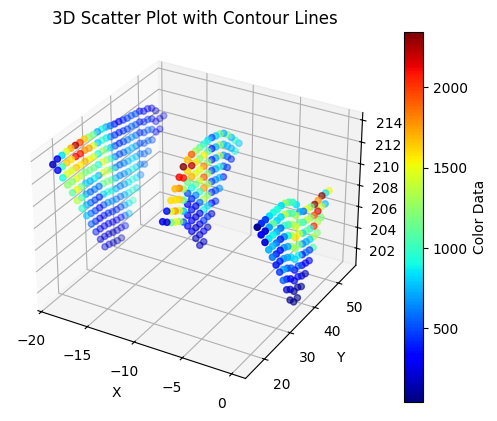

In [ ]:
# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Extract data
x = df_merge['X']
y = df_merge['Y']
z = df_merge['Z']
color_data = df_merge['resist']

# Scatter plot with color mapping
#scatter = ax.scatter(x, y, z, s=10)
scatter = ax.scatter(x, y, z, c=color_data, cmap='jet', s=20)

# Add color bar for the scatter plot
cbar = plt.colorbar(scatter)
cbar.set_label('Color Data')

# Set axis labels and title
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Elevation')
plt.title('3D Scatter Plot with Contour Lines')

# Show the plot
plt.show()
#

In [ ]:
#y = df_merge[df_merge['X']==0]['Y']
#z = -df_merge[df_merge['X']==0]['Z']

In [ ]:
from scipy.interpolate import griddata

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

2D Resistivity Contour

In [ ]:
#Define grid points for the contour plot
#x_grid, y_grid, z_grid = np.meshgridx_grid, y_grid, z_grid = np.meshgrid(np.linspace(x.min(), x.max(), 20), np.linspace(y.min(), y.max(), 20), np.linspace(z.min(), z.max(), 20))

In [ ]:
x = df_merge['X']
y = df_merge['Y']
z = df_merge['Z']
resist= df_merge['resist']

ไม่เข้าใจ รู้แค่ว่าเป็นการสร้าง point มารับ resist เพื่อสร้าง surface

In [ ]:
#Create a grid for X and Y
x_grid = np.linspace(x.min(), x.max(), 100)
y_grid = np.linspace(y.min(), y.max(), 100)
x_grid, y_grid = np.meshgrid(x_grid, y_grid)

เอาค่า resist ไปใส่ใน Point ที่สร้างขึ้นก่อนหน้า

In [ ]:
#Interpolate resistivity values onto the grid
resist_grid = griddata((x, y), resist, (x_grid, y_grid), method='linear')

ไม่เข้าใจว่า Plot surface ออกมาหรือ layer depth ไหน?

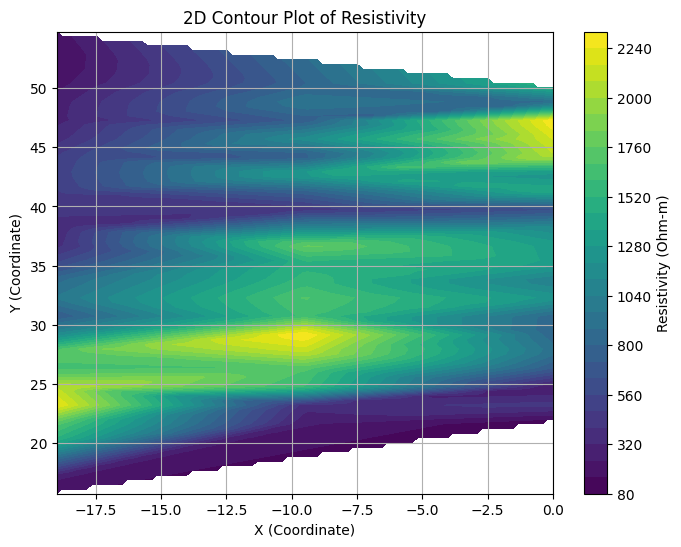

In [ ]:
#Create the contour plot
plt.figure(figsize=(8, 6))
contour = plt.contourf(x_grid, y_grid, resist_grid, cmap='viridis', levels=30)
# Step 5: Add a color bar
cbar = plt.colorbar(contour)
cbar.set_label('Resistivity (Ohm-m)')

# Step 6: Set axis labels and title
plt.xlabel('X (Coordinate)')
plt.ylabel('Y (Coordinate)')
plt.title('2D Contour Plot of Resistivity')

# Step 7: Show the plot
plt.grid(True)
plt.show()

เริ่มทำใหม่

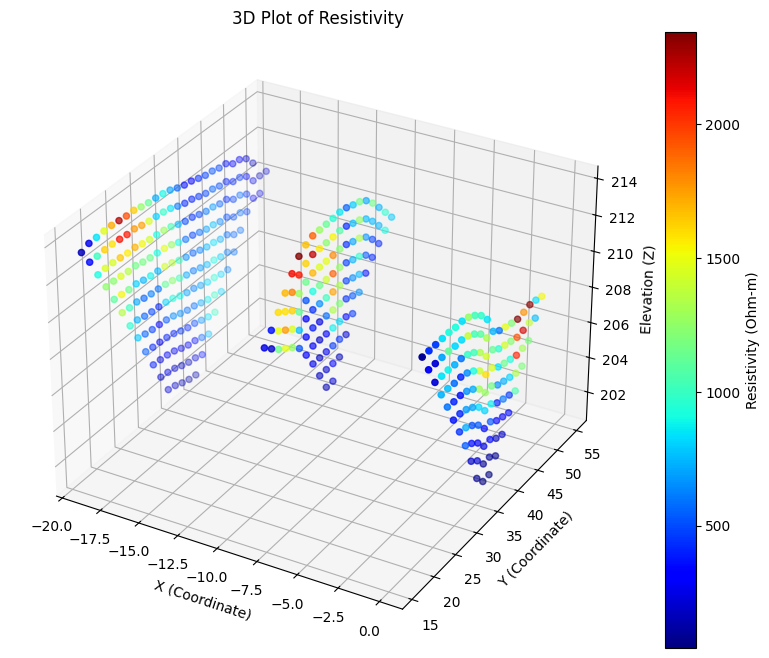

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Create 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of X, Y, Z with resistivity as color
sc = ax.scatter(x, y, z, c=resist, cmap='jet')
fig.colorbar(sc, label='Resistivity (Ohm-m)')

ax.set_xlabel('X (Coordinate)')
ax.set_ylabel('Y (Coordinate)')
ax.set_zlabel('Elevation (Z)')

ax.set_title('3D Plot of Resistivity')

plt.show()

In [ ]:
# Extract data
x = df_merge['X']
y = df_merge['Y']
z = df_merge['Z']
resist= df_merge['resist']

# Define the grid for contour plotting
x_grid, y_grid, z_grid = np.meshgrid(np.linspace(x.min(), x.max(), 20),
                                     np.linspace(y.min(), y.max(), 20),
                                     np.linspace(z.min(), z.max(), 20)) #เปลี่ยน num เพิ่มความละเอียดได้


In [ ]:
from scipy.interpolate import griddata
import numpy as np

# Try linear interpolation first
resist_grid = griddata((x, y, z), resist, (x_grid, y_grid, z_grid), method='linear') #can define NaNs as "0" for interpolation

# Find NaNs and fill with nearest neighbor
resist_grid_nanfix = np.where(
    np.isnan(resist_grid),
    griddata((x, y, z), resist, (x_grid, y_grid, z_grid), method='nearest'),
    resist_grid
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Choose a slice along X (e.g., the middle of the X dimension)
x_index = resist_grid.shape[0] // 3
print(resist_grid.shape[0])

20


In [ ]:
print(np.isnan(resist_slice).all())  # True means everything is NaN
print(np.nanmin(resist_slice), np.nanmax(resist_slice))

False
138.0715314765083 1685.6470046119275


In [ ]:
pip install plotly


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

In [ ]:
import plotly.graph_objects as go
import numpy as np

# Group 1: 0–150 ohm·m → Light brown (natural material)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=0,
    isomax=90,
    surface_count=50,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#e6ddca'], [1, '#e6ddca']],
    opacity=0.5,
    showscale=False
)
)

# Group 2: 90–150 ohm·m → Dark brown (slag)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=90,
    isomax=700,
    surface_count=50,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#caa557'], [1, '#caa557']],
    opacity=0.5,
    showscale=False
))

# Group 3: 700–max → Yellowish brown (burnt clay)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=700,
    isomax=np.nanmax(resist_grid),
    surface_count=50,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#B8A38F'], [1, '#B8A38F']],
    opacity=0.5,
    showscale=True  # Only one scale needed
))
fig.update_layout(
    width=1000,
    height=700
)

CalCulation of Slag

In [ ]:
#Group ERT class
# Group 1: 0–90 ohm·m → Light brown (natural material)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=0,
    isomax=90,
    surface_count=3,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#e6ddca'], [1, '#e6ddca']],
    opacity=0.5,
    showscale=False
))

# Group 2: 90–700 ohm·m → Dark brown (slag)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=90,
    isomax=700,
    surface_count=3,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#caa557'], [1, '#caa557']],
    opacity=0.5,
    showscale=False
))

# Group 3: 700–max → Yellowish brown (burnt clay)
fig.add_trace(go.Isosurface(
    x=x_grid.flatten(),
    y=-y_grid.flatten(),
    z=z_grid.flatten(),
    value=resist_grid.flatten(),
    isomin=700,
    isomax=np.nanmax(resist_grid),
    surface_count=3,
    caps=dict(x_show=False, y_show=False, z_show=False),
    colorscale=[[0, '#B8A38F'], [1, '#B8A38F']],
    opacity=0.8,
    showscale=True  # Only one scale needed
))


In [ ]:
print("Min resistivity:", np.nanmin(resist_grid))
print("Max resistivity:", np.nanmax(resist_grid))


Min resistivity: 72.8409232994118
Max resistivity: 2301.786714175374


In [ ]:
group3_voxels = np.sum(resist_grid >= 700)
print("Number of voxels in Group 3:", group3_voxels)


Number of voxels in Group 3: 1697


In [ ]:
print("Number of NaNs:", np.isnan(resist_grid).sum())


Number of NaNs: 4673


In [ ]:
print("Min resistivity:", np.nanmin(resist_grid))
print("Max resistivity:", np.nanmax(resist_grid))
print("Number of voxels in Group 3 (>=700):", np.sum(resist_grid >= 700))
print("Shape of resist_grid:", resist_grid.shape)


Min resistivity: 72.8409232994118
Max resistivity: 2301.786714175374
Number of voxels in Group 3 (>=700): 1697
Shape of resist_grid: (20, 20, 20)


In [ ]:
# Calculate voxel size assuming uniform spacing
dx = np.mean(np.diff(np.unique(x_grid)))
dy = np.mean(np.diff(np.unique(y_grid)))
dz = np.mean(np.diff(np.unique(z_grid)))

print(f"dx: {dx}, dy: {dy}, dz: {dz}")

# Voxel volume in m³
voxel_volume = dx * dy * dz
print(f"Voxel volume: {voxel_volume:.4f} m³")

# Group 3 total volume
group3_voxels = np.sum(resist_grid >= 700)
group3_volume = group3_voxels * voxel_volume

print(f"Group 3 (≥ 700 ohm·m) volume: {group3_volume:.2f} cubic meters")

dx: 1.0, dy: 2.0526315789473686, dz: 0.6583763736842103
Voxel volume: 1.3514 m³
Group 3 (≥ 700 ohm·m) volume: 2293.33 cubic meters


In [ ]:
# Extract unique X and Y values
unique_x = np.unique(x_grid)
unique_y = np.unique(y_grid)

# Compute grid spacing (assumed uniform)
dx = np.mean(np.diff(unique_x))
dy = np.mean(np.diff(unique_y))

# Compute number of unique grid cells in XY
nx = len(unique_x)
ny = len(unique_y)

# Planar surface area (XY projection)
planar_area = dx * dy * (nx - 1) * (ny - 1)

print(f"Planar surface area of the model: {planar_area:.2f} square meters")


Planar surface area of the model: 741.00 square meters
